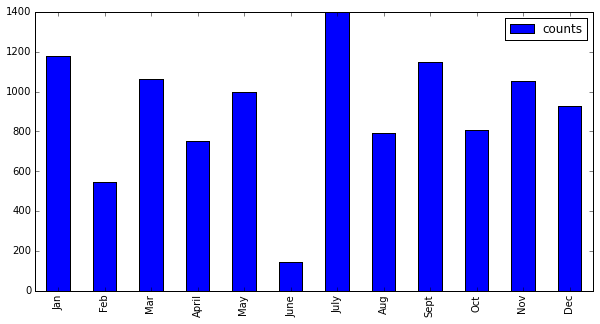

{0: 1177, 1: 546, 2: 1063, 3: 754, 4: 996, 5: 146, 6: 1400, 7: 792, 8: 1146, 9: 808, 10: 1052, 11: 929}


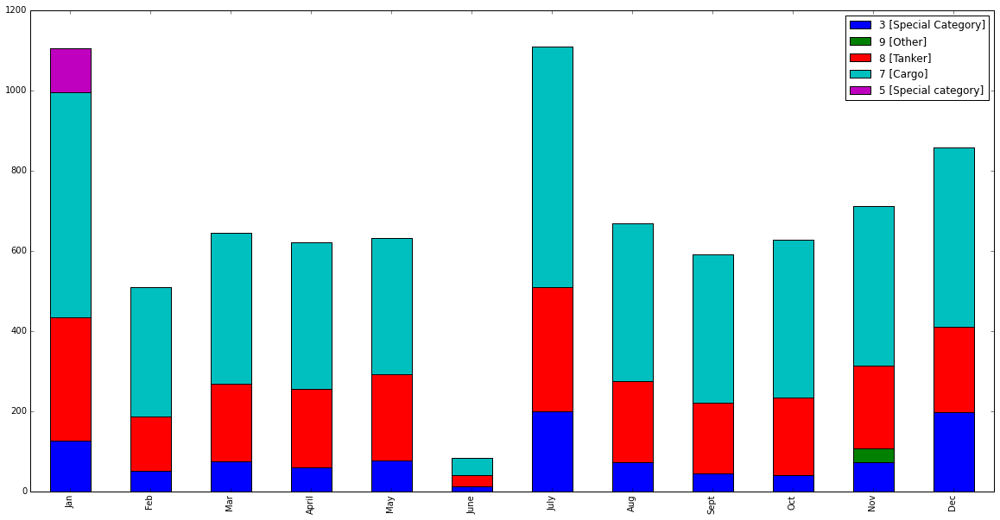

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
import operator
import heapq
from osgeo import ogr
%matplotlib inline
driver = ogr.GetDriverByName("OpenFileGDB")

def get_month_counts(files_array):
    month_counts={}
    month_mmsi=[]
    for index, files in enumerate(files_array):
        uniq_vessels=set()
        ds=driver.Open(files,0)
        layer=ds.GetLayer(1)
        for feat in layer:
            mmsi=feat.GetField("MMSI")
            if(index==0):
                uniq_vessels.add(mmsi)
            else:
                if mmsi not in month_mmsi[index-1]:
                    uniq_vessels.add(mmsi)
   
        month_mmsi.append(uniq_vessels)
        if index not in month_counts:
            month_counts[index]=len(uniq_vessels)
    array=[]
    for x in month_counts:
        array.append(month_counts[x])
    LABELS = ["Jan", "Feb", "Mar","April","May", "June", "July","Aug","Sept", "Oct", "Nov","Dec"]
    df1=pd.DataFrame()
    df1['counts']=pd.Series(array,index=LABELS)
    df1.plot(kind='bar',figsize=(10,5)); 
    plt.show()
    print(month_counts)

def get_majority_voyage_types(files_array):
    month_dic={}
    month_mmsi=[]
    for index, files in enumerate(files_array):
        uniq_vessels=set()
        vesseltype_dict={}
    
        ds=driver.Open(files,0)
        layer=ds.GetLayer(1)
        for feature in layer:
            mmsi=feature.GetField("MMSI")
            uniq_vessels.add(mmsi)
            if(index==0 or mmsi not in month_mmsi[index-1]): 
                VesselType =feature.GetField("VesselType")
                VesselType=str(VesselType)
                if VesselType[0] not in vesseltype_dict:
                    vesseltype_dict[VesselType[0]]=1
                else:
                    vesseltype_dict[VesselType[0]]+=1
    
        month_mmsi.append(uniq_vessels)
        new_v_dict=heapq.nlargest(4, vesseltype_dict, key=vesseltype_dict.get)
    
        final_v_dict={}
        for k in new_v_dict:
            k=str(k)
            if k not in final_v_dict:
                final_v_dict[k]=vesseltype_dict[k]
        vesseltype_dict_final = dict(sorted(final_v_dict.items(),key = operator.itemgetter(1),reverse = True))
        if index not in month_dic:
            month_dic[index]=vesseltype_dict_final
           
    uniq_types=set()
    for x in month_dic:
        g=dict(month_dic[x])
        for y in g:
            if(y != '0'):
                uniq_types.add(y)

    bar_dict={}
    for num_type in uniq_types:
        if num_type not in bar_dict:
            bar_dict[num_type]=[]
        for month in month_dic:
            if num_type in month_dic[month]:
                bar_dict[num_type].append(month_dic[month][num_type])
            else:
                bar_dict[num_type].append(0)      
        
# 1 = Reserved
# 2 = Wing In Ground
# 3 = Special Category
# 4 = High-Speed Craft
# 5 = Special Category
# 6 = Passenger
# 7 = Cargo
# 8 = Tanker
# 9 = Other
    df = pd.DataFrame()
    LABELS = ["Jan", "Feb", "Mar","April","May", "June", "July","Aug","Sept", "Oct", "Nov","Dec"] 
    ship_type=["Reserverd","Wing In Ground","Special Category","High-Speed Craft","Special category","Passenger","Cargo","Tanker","Other"]
    for counts in bar_dict:
        type=int(counts)
        df[counts+" ["+ship_type[type-1]+"]"]=pd.Series(bar_dict[counts], index=LABELS)

    df.plot(kind='bar', stacked=True,figsize=(20,10));
    plt.show() 
    
def run(): 
    files_array=["/Users/rishuvaid/Desktop/data/Zone19_2009_01.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_02.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_03.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_04.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_05.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_06.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_07.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_08.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_09.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_10.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_11.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_12.gdb"]
    get_month_counts(files_array)
    get_majority_voyage_types(files_array)

if __name__ == '__main__':
    run()



Point Counts:  [  1.76000000e+02   2.80000000e+01   1.41900000e+03   3.40000000e+01
   2.40000000e+01   4.00000000e+00   5.60000000e+01   8.00000000e+00
   9.00000000e+00   7.00000000e+00   7.00000000e+00   1.00000000e+00
   6.00000000e+00   1.00000000e+01   8.00000000e+00   5.00000000e+00
   1.10000000e+01   6.00000000e+00   7.00000000e+00   1.00000000e+01
   7.00000000e+00   8.00000000e+00   9.00000000e+00   3.00000000e+00
   8.00000000e+00   8.00000000e+00   1.00000000e+00   2.00000000e+00
   4.00000000e+00   4.00000000e+00   1.00000000e+00   5.00000000e+00
   3.00000000e+00   2.00000000e+00   3.49060000e+04   5.00000000e+00
   2.43000000e+02   8.00000000e+00   5.70000000e+01   3.35000000e+02
   4.00000000e+00   2.30000000e+01   1.00000000e+01   1.00000000e+01
   6.00000000e+00   9.00000000e+00   3.00000000e+00   2.00000000e+00
   1.00000000e+01   7.00000000e+00   3.20000000e+01   1.70000000e+01
   7.80000000e+01   3.20000000e+01   4.00000000e+00   1.00000000e+00
   6.00000000e+00  

/Users/rishuvaid/anaconda/lib/python3.4/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


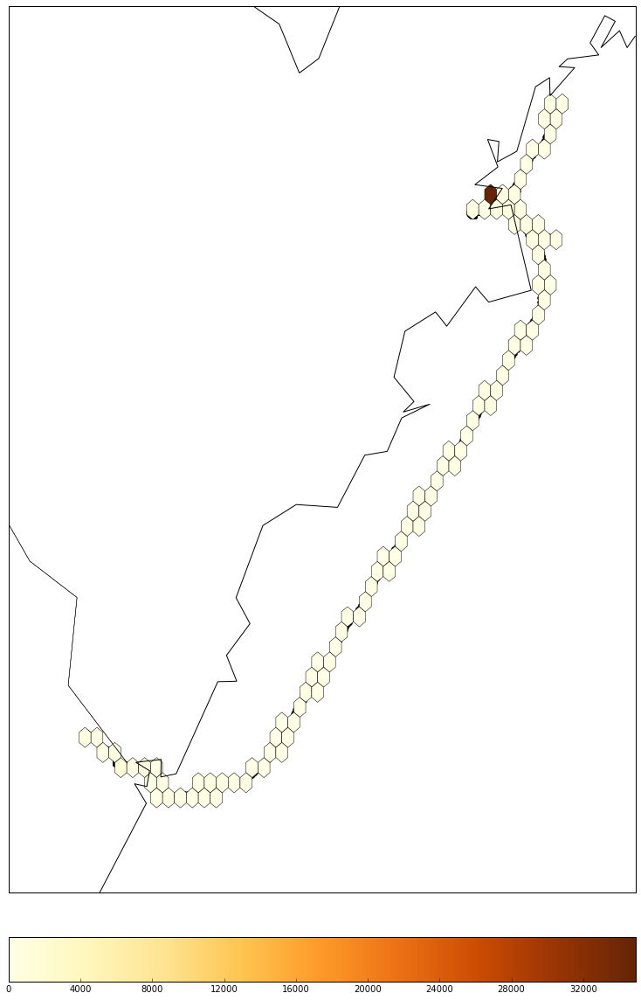

In [10]:
import matplotlib.pyplot as plt
import numpy as np
from osgeo import ogr
from mpl_toolkits.basemap import Basemap
from numpy import array
%matplotlib inline
driver = ogr.GetDriverByName("OpenFileGDB")

def create_hexbin(f,voyage_id):
    ds = driver.Open(f, 0)
    layer=ds.GetLayer()

    if(1<=int(voyage_id)<=10):
        #layer.SetAttributeFilter("VoyageID ="+voyage_id+"")
        layer.SetAttributeFilter("VoyageID <'2'")
        mx=[]
        my=[]

        for feat in layer:
            geom = feat.GetGeometryRef()
            mx.append(geom.GetX())
            my.append(geom.GetY())
 
        llcrnr_lon=min(mx)-0.10
        llcrnr_lat=min(my)-0.10
        urcrnr_lon=max(mx)+0.10
        urcrnr_lat=max(my)+0.10
        
        plt.figure(figsize=(15,20))
        map = Basemap(llcrnrlon=llcrnr_lon,llcrnrlat=llcrnr_lat,urcrnrlon=urcrnr_lon,urcrnrlat=urcrnr_lat,resolution='i',projection='tmerc',lat_0=29.40,lon_0=-68.83)    
 
        x,y=map(mx,my)
        map.scatter(x, y, color='k')
        map.drawcoastlines()
        map.drawstates()
    
        u=map.hexbin(array(x),array(y),gridsize=40, mincnt=1,linewidths=0.5, edgecolors='k',cmap='YlOrBr')
        print("Point Counts: ", u.get_array())   
        cb=map.colorbar(location='bottom',pad='5%')
  
    else:
        print("Uh oh, I don't know about this voyage_id")
    

def run(): 
    files_array=["/Users/rishuvaid/Desktop/data/Zone19_2009_01.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_02.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_03.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_04.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_05.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_06.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_07.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_08.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_09.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_10.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_11.gdb",
             "/Users/rishuvaid/Desktop/data/Zone19_2009_12.gdb"]
    create_hexbin(files_array[0],'1')

if __name__ == '__main__':
    run()




In [11]:
from osgeo import ogr
import folium
from IPython.display import HTML

def display(m, height=300):
    m._build_map()
    srcdoc = m.HTML.replace('"', '&quot;')
    embed = HTML('<iframe srcdoc="{0}" '
                 'style="width: 100%; height: {1}px; '
                 'border: none"></iframe>'.format(srcdoc, height))
    return embed

map_osm = folium.Map()
driver = ogr.GetDriverByName("OpenFileGDB") 
ds = driver.Open(r"/Users/rishuvaid/Desktop/data/Zone19_2009_01.gdb", 0)

layer=ds.GetLayer()

layer.SetAttributeFilter("VoyageID < '11'")

voyage_dic ={}

for feat in layer:
    voyage_id=feat.GetField("VoyageID")
    if voyage_id not in voyage_dic:
        voyage_dic[voyage_id]=[]
    else:
        geom = feat.GetGeometryRef()
        cod_array=(geom.GetY(),geom.GetX())
        voyage_dic[voyage_id].append(cod_array)

#final_voyages=[]
#for voyage_id in voyage_dic:
#    final_voyages.append(voyage_dic[voyage_id])
final_voyages = voyage_dic.values() 
map_osm.multiline(final_voyages, line_color='#FF0000', line_weight=3)

map_osm.lat_lng_popover()
display(map_osm)
#map_osm.create_map(path='osm.html')

In [ ]:
from osgeo import ogr
import folium
from IPython.display import HTML

def display(m, height=300):
    m._build_map()
    srcdoc = m.HTML.replace('"', '&quot;')
    embed = HTML('<iframe srcdoc="{0}" '
                 'style="width: 100%; height: {1}px; '
                 'border: none"></iframe>'.format(srcdoc, height))
    return embed

map_osm = folium.Map()
driver = ogr.GetDriverByName("OpenFileGDB") 
ds = driver.Open(r"/Users/rishuvaid/Desktop/data/Zone19_2009_01.gdb", 0)

set_filter="VoyageID < '100'"
layer=ds.GetLayer()
layer1=ds.GetLayer(1)
    
vesseltype_dict={}
         
mmsi_type_dic={}    
for feature in layer1:   
    mmsi=feature.GetField("MMSI")
    VesselType =feature.GetField("VesselType")
    VesselType=str(VesselType)
    VesselType=VesselType[0]
    
    if mmsi not in mmsi_type_dic:
        mmsi_type_dic[mmsi]=VesselType

voyage_dic ={}

for feat in layer:
    mmsi=feat.GetField("MMSI")
    if mmsi in mmsi_type_dic.keys():
        if mmsi not in voyage_dic:
            voyage_dic[mmsi]=[]
        else:
            geom = feat.GetGeometryRef()
            cod_array=(geom.GetY(),geom.GetX())
            voyage_dic[mmsi].append(cod_array)


final_voyages={}
for mmsi in voyage_dic:
    type=mmsi_type_dic[mmsi]
    if type not in final_voyages:
        final_voyages[type]=[]
        final_voyages[type].append(voyage_dic[mmsi])
    else:
        final_voyages[type].append(voyage_dic[mmsi])

#map_osm.multiline(final_voyages['1'], line_color='#FF0000', line_weight=3)
#map_osm.multiline(final_voyages['2'], line_color='#00BFFF', line_weight=3)
map_osm.multiline(final_voyages['3'], line_color='#008B45', line_weight=3)
#map_osm.multiline(final_voyages['4'], line_color='#68228B', line_weight=3)
map_osm.multiline(final_voyages['5'], line_color='#CD1076', line_weight=3)
#map_osm.multiline(final_voyages['6'], line_color='#D2691E', line_weight=3)
map_osm.multiline(final_voyages['7'], line_color='#0000CD', line_weight=3)
map_osm.multiline(final_voyages['8'], line_color='#B0171F', line_weight=3)
map_osm.multiline(final_voyages['9'], line_color='#00F5FF', line_weight=3)

map_osm.lat_lng_popover()
#display(map_osm)
map_osm.create_map(path='try_osm.html')